In [1]:
#set up environment
import pickle as pkl
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal as sig
from scipy.io import loadmat, savemat
import warnings
#from Interictal_Spike_Analysis.HUMAN.working_feat_extract_code.functions.ied_fx_v3 import value_basis_multiroi
warnings.filterwarnings('ignore')
import seaborn as sns
#get all functions 
import sys, os
code_path = os.path.dirname('/mnt/leif/littlab/users/aguilac/Interictal_Spike_Analysis/HUMAN/working_feat_extract_code/functions/')
sys.path.append(code_path)
from ied_fx_v3 import *
pd.options.display.max_rows = 999

from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import rand
from pylab import figure



#Setup ptnames and directory
data_directory = ['/mnt/leif/littlab/users/aguilac/Projects/FC_toolbox/results/mat_output_v2', '/mnt/leif/littlab/data/Human_Data']
pt = pd.read_csv('/mnt/leif/littlab/users/aguilac/Projects/FC_toolbox/results/mat_output_v2/pt_data/pkl_list.csv') #pkl list is our list of the transferred data (mat73 -> pickle)
pt = pt['pt'].to_list()
blacklist = ['HUP101' ,'HUP112','HUP115','HUP124','HUP144','HUP147','HUP149','HUP155','HUP176','HUP193','HUP194','HUP195','HUP198','HUP208','HUP212','HUP216','HUP217','HUP064','HUP071','HUP072','HUP073','HUP085','HUP094']
ptnames = [i for i in pt if i not in blacklist] #use only the best EEG signals (>75% visually validated)


#establish ROI's
roiL_mesial = [' left entorhinal ', ' left parahippocampal ' , ' left hippocampus ', ' left amygdala ', ' left perirhinal ']
roiL_lateral = [' left inferior temporal ', ' left superior temporal ', ' left middle temporal ', ' left fusiform ', ' left transverse temporal '] #lingual??
roiR_mesial = [' right entorhinal ', ' right parahippocampal ', ' right hippocampus ', ' right amygdala ', ' right perirhinal ']
roiR_lateral = [' right inferior temporal ', ' right superior temporal ', ' right middle temporal ', ' right fusiform ', ' right transverse temporal ']
emptylabel = ['EmptyLabel','NaN']
L_OC = [' left inferior parietal ', ' left postcentral ', ' left superior parietal ', ' left precentral ', ' left rostral middle frontal ', ' left pars triangularis ', ' left supramarginal ', ' left insula ', ' left caudal middle frontal ', ' left posterior cingulate ', ' left lateral orbitofrontal ', ' left lateral occipital ', ' left cuneus ']
R_OC = [' right inferior parietal ', ' right postcentral ', ' right superior parietal ', ' right precentral ', ' right rostral middle frontal ', ' right pars triangularis ', ' right supramarginal ', ' right insula ', ' right caudal middle frontal ', ' right posterior cingulate ', ' right lateral orbitofrontal ', ' right lateral occipital ', ' right cuneus ']

roilist = [roiL_mesial, roiL_lateral, roiR_mesial, roiR_lateral, L_OC, R_OC, emptylabel]

In [5]:
def checker(ptname):
        
    data_directory = ['/mnt/leif/littlab/users/aguilac/Projects/FC_toolbox/results/mat_output_v2', '/mnt/leif/littlab/data/Human_Data']
    # spike, brain_df, soz, id = load_ptall(ptname, data_directory, change_label = False)
    # print(id)
    # print(soz)

    # print(np.unique(spike.select[:,3]))
    #establish ROI's
    roiL_mesial = [' left entorhinal ', ' left parahippocampal ' , ' left hippocampus ', ' left amygdala ', ' left perirhinal ']
    roiL_lateral = [' left inferior temporal ', ' left superior temporal ', ' left middle temporal ', ' left fusiform ', ' left transverse temporal '] #lingual??
    roiR_mesial = [' right entorhinal ', ' right parahippocampal ', ' right hippocampus ', ' right amygdala ', ' right perirhinal ']
    roiR_lateral = [' right inferior temporal ', ' right superior temporal ', ' right middle temporal ', ' right fusiform ', ' right transverse temporal ']
    emptylabel = ['EmptyLabel','NaN']
    L_OC = [' left inferior parietal ', ' left postcentral ', ' left superior parietal ', ' left precentral ', ' left rostral middle frontal ', ' left pars triangularis ', ' left supramarginal ', ' left insula ', ' left caudal middle frontal ', ' left posterior cingulate ', ' left lateral orbitofrontal ', ' left lateral occipital ', ' left cuneus ']
    R_OC = [' right inferior parietal ', ' right postcentral ', ' right superior parietal ', ' right precentral ', ' right rostral middle frontal ', ' right pars triangularis ', ' right supramarginal ', ' right insula ', ' right caudal middle frontal ', ' right posterior cingulate ', ' right lateral orbitofrontal ', ' right lateral occipital ', ' right cuneus ']

    #label name check
    roilist = [roiL_mesial, roiL_lateral, roiR_mesial, roiR_lateral, L_OC, R_OC, emptylabel]
    pd.options.display.max_rows = 999
    # display(brain_df)

    #plot check
    X = brain_df['x'].to_list()
    Y = brain_df['y'].to_list()
    Z = brain_df['z'].to_list()
 
    fig = figure(figsize=(15,15))
    ax = fig.add_subplot(projection='3d')

    X = brain_df['x'].to_list()
    Y = brain_df['y'].to_list()
    Z = brain_df['z'].to_list()
    names = brain_df['key_0'].to_list()

    for i in range(len(X)): #plot each point + it's index as text above
        ax.scatter(X[i],Y[i],Z[i],color='b') 
        ax.text(X[i],Y[i],Z[i],  '%s' % (str(names[i])), size=10, zorder=1,  
        color='k') 

    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    pyplot.show()

    #value check
    vals, idxch, chs, select_oi = value_basis_multiroi(spike, brain_df, roilist)
    basis_results = [vals, idxch, chs, select_oi]
    count_roi = []
    for roi in select_oi:
        count_roi.append(np.size(roi))
    print('L Mesial, L lateral, R Mesial, R Lateral, L OC, R OC, Empty')
    print(count_roi)

    return count_roi, brain_df, spike, basis_results

In [4]:
count_roi, brain_df, spike, basis_results = checker('HUP096')

NameError: name 'brain_df' is not defined

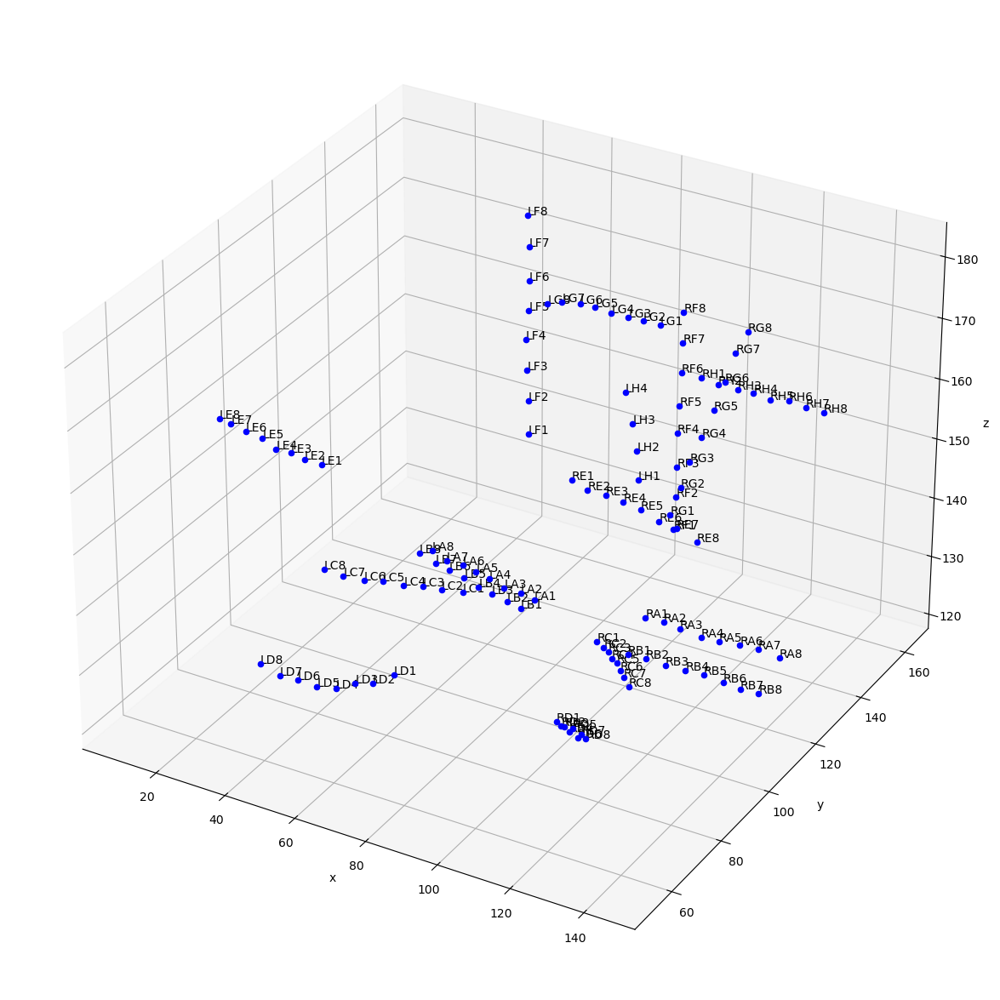

In [3]:
brain_df = pd.read_csv("/mnt/leif/littlab/data/Human_Data/CNT_iEEG_BIDS/sub-RID0238/derivatives/ieeg_recon/module3/sub-RID0238_ses-clinical01_space-T00mri_atlas-DKTantspynet_radius-2_desc-vox_coordinates.csv")

#plot check
X = brain_df['x'].to_list()
Y = brain_df['y'].to_list()
Z = brain_df['z'].to_list()

fig = figure(figsize=(15,15))
ax = fig.add_subplot(projection='3d')

X = brain_df['x'].to_list()
Y = brain_df['y'].to_list()
Z = brain_df['z'].to_list()
names = brain_df['name'].to_list()

for i in range(len(X)): #plot each point + it's index as text above
    ax.scatter(X[i],Y[i],Z[i],color='b') 
    ax.text(X[i],Y[i],Z[i],  '%s' % (str(names[i])), size=10, zorder=1,  
    color='k') 

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
pyplot.show()


In [ ]:
#get some values to work with.
spike, brain_df, soz, id = load_ptall('HUP223', data_directory, change_label= False)
based_values, idx_roich, chs, select_oi =value_basis(spike, brain_df, roiR_lateral)
print(idx_roich)

[[114, 123, 125, 126, 127, 129, 130, 145, 146, 147, 148, 104, 135, 137, 138, 105, 106, 107, 116, 117, 118, 121, 122, 139, 149, 113, 131, 132, 143, 144], [114, 123, 125, 126, 127, 129, 130, 145, 146, 147, 148, 104, 135, 137, 138, 105, 106, 107, 116, 117, 118, 121, 122, 139, 149, 113, 131, 132, 143, 144], [114, 123, 125, 126, 127, 129, 130, 145, 146, 147, 148, 104, 135, 137, 138, 105, 106, 107, 116, 117, 118, 121, 122, 139, 149, 113, 131, 132, 143, 144], [114, 123, 125, 126, 127, 129, 130, 145, 146, 147, 148, 104, 135, 137, 138, 105, 106, 107, 116, 117, 118, 121, 122, 139, 149, 113, 131, 132, 143, 144], [114, 123, 125, 126, 127, 129, 130, 145, 146, 147, 148, 104, 135, 137, 138, 105, 106, 107, 116, 117, 118, 121, 122, 139, 149, 113, 131, 132, 143, 144], [114, 123, 125, 126, 127, 129, 130, 145, 146, 147, 148, 104, 135, 137, 138, 105, 106, 107, 116, 117, 118, 121, 122, 139, 149, 113, 131, 132, 143, 144], [114, 123, 125, 126, 127, 129, 130, 145, 146, 147, 148, 104, 135, 137, 138, 105, 106, 1

In [ ]:
#corrrect chs
chlist = np.array([x-1  for x in chs])

In [ ]:
#manually verify missing data
X = 78
Y = np.where(chlist == X)[0]
print(Y)

[ 24 116 228 260 298 328 346 353 368 426 429 508 557 574 579 586 601 608
 613 652 729 788 797 823 829 846 855 858 895 900]


In [ ]:
spike.chlabels[0]

array([array([[array(['C3-CAR'], dtype='<U6')],
              [array(['C4-CAR'], dtype='<U6')],
              [array(['CZ-CAR'], dtype='<U6')],
              [array(['EKG1-CAR'], dtype='<U8')],
              [array(['EKG2-CAR'], dtype='<U8')],
              [array(['FZ-CAR'], dtype='<U6')],
              [array(['LA1-CAR'], dtype='<U7')],
              [array(['LA2-CAR'], dtype='<U7')],
              [array(['LA3-CAR'], dtype='<U7')],
              [array(['LA4-CAR'], dtype='<U7')],
              [array(['LA5-CAR'], dtype='<U7')],
              [array(['LA6-CAR'], dtype='<U7')],
              [array(['LA7-CAR'], dtype='<U7')],
              [array(['LA8-CAR'], dtype='<U7')],
              [array(['LA9-CAR'], dtype='<U7')],
              [array(['LA10-CAR'], dtype='<U8')],
              [array(['LA11-CAR'], dtype='<U8')],
              [array(['LA12-CAR'], dtype='<U8')],
              [array(['LB1-CAR'], dtype='<U7')],
              [array(['LB2-CAR'], dtype='<U7')],
              [arra

In [ ]:
print(spike.select[:,3])

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

In [ ]:
#get chlabel names
chlabel_box = brain_df['name'].to_list()
eeg_list = spike.chlabels[0][2]
eeg_list = [i[0][0] for i in eeg_list]


In [ ]:
print(eeg_list)

['C3-CAR', 'C4-CAR', 'CZ-CAR', 'EKG1-CAR', 'EKG2-CAR', 'FZ-CAR', 'LA1-CAR', 'LA2-CAR', 'LA3-CAR', 'LA4-CAR', 'LA5-CAR', 'LA6-CAR', 'LA7-CAR', 'LA8-CAR', 'LA9-CAR', 'LA10-CAR', 'LA11-CAR', 'LA12-CAR', 'LB1-CAR', 'LB2-CAR', 'LB3-CAR', 'LB4-CAR', 'LB5-CAR', 'LB6-CAR', 'LB7-CAR', 'LB8-CAR', 'LB9-CAR', 'LB10-CAR', 'LB11-CAR', 'LB12-CAR', 'LC1-CAR', 'LC2-CAR', 'LC3-CAR', 'LC4-CAR', 'LC5-CAR', 'LC6-CAR', 'LC7-CAR', 'LC8-CAR', 'LC9-CAR', 'LC11-CAR', 'LC12-CAR', 'LD1-CAR', 'LD2-CAR', 'LD3-CAR', 'LD4-CAR', 'LD5-CAR', 'LD6-CAR', 'LD7-CAR', 'LD8-CAR', 'LD9-CAR', 'LD10-CAR', 'LD11-CAR', 'LD12-CAR', 'LE1-CAR', 'LE2-CAR', 'LE3-CAR', 'LE4-CAR', 'LE5-CAR', 'LE6-CAR', 'LE7-CAR', 'LE8-CAR', 'LE9-CAR', 'LE10-CAR', 'LE11-CAR', 'LE12-CAR', 'LF1-CAR', 'LF2-CAR', 'LF3-CAR', 'LF4-CAR', 'LF5-CAR', 'LF6-CAR', 'LF7-CAR', 'LF8-CAR', 'LOC-CAR', 'RA1-CAR', 'RA2-CAR', 'RA3-CAR', 'RA4-CAR', 'RA5-CAR', 'RA6-CAR', 'RA7-CAR', 'RA8-CAR', 'RA9-CAR', 'RA10-CAR', 'RA11-CAR', 'RA12-CAR', 'RB1-CAR', 'RB2-CAR', 'RB3-CAR', 'RB4-

In [ ]:
print(chlabel_box)

['LA1-CAR', 'LA2-CAR', 'LA3-CAR', 'LA4-CAR', 'LA5-CAR', 'LA6-CAR', 'LA7-CAR', 'LA8-CAR', 'LA9-CAR', 'LA10-CAR', 'LA11-CAR', 'LA12-CAR', 'LB1-CAR', 'LB2-CAR', 'LB3-CAR', 'LB4-CAR', 'LB5-CAR', 'LB6-CAR', 'LB7-CAR', 'LB8-CAR', 'LB9-CAR', 'LB10-CAR', 'LB11-CAR', 'LB12-CAR', 'LC1-CAR', 'LC2-CAR', 'LC3-CAR', 'LC4-CAR', 'LC5-CAR', 'LC6-CAR', 'LC7-CAR', 'LC8-CAR', 'LC9-CAR', 'LC10-CAR', 'LC11-CAR', 'LC12-CAR', 'LD1-CAR', 'LD2-CAR', 'LD3-CAR', 'LD4-CAR', 'LD5-CAR', 'LD6-CAR', 'LD7-CAR', 'LD8-CAR', 'LD9-CAR', 'LD10-CAR', 'LD11-CAR', 'LD12-CAR', 'LE1-CAR', 'LE2-CAR', 'LE3-CAR', 'LE4-CAR', 'LE5-CAR', 'LE6-CAR', 'LE7-CAR', 'LE8-CAR', 'LE9-CAR', 'LE10-CAR', 'LE11-CAR', 'LE12-CAR', 'LF1-CAR', 'LF2-CAR', 'LF3-CAR', 'LF4-CAR', 'LF5-CAR', 'LF6-CAR', 'LF7-CAR', 'LF8-CAR', 'RA1-CAR', 'RA2-CAR', 'RA3-CAR', 'RA4-CAR', 'RA5-CAR', 'RA6-CAR', 'RA7-CAR', 'RA8-CAR', 'RA9-CAR', 'RA10-CAR', 'RA11-CAR', 'RA12-CAR', 'RB1-CAR', 'RB2-CAR', 'RB3-CAR', 'RB4-CAR', 'RB5-CAR', 'RB6-CAR', 'RB7-CAR', 'RB8-CAR', 'RB9-CAR', 'R

In [ ]:
#how to get which element in one list is not in another list

yo = [x for x in chlabel_box if x not in eeg_list] #labels in brain_df but not in ieeg
yo_inv = [x for x in eeg_list if x not in chlabel_box] #labels in ieeg but not in brain_df

In [ ]:
#find rows in brain_df that are not in ieeg
brain_df[brain_df['name'].isin(yo)]

,key_0,name,x,y,z,label,labels_sorted1,percent_assigned1,threshold_label,at_dkt_labels,merge_indicator,final_label
33,LC10,LC10-CAR,30.8273,106.145,64.0921,EmptyLabel,NaN,NaN,EmptyLabel,None,both,EmptyLabel
113,RD10,RD10-CAR,158.6900,129.769,75.3009,EmptyLabel,right middle temporal,0.272727,right middle temporal,right middle temporal,both,right middle temporal


In [ ]:
#print labels in ieeg but not in brain_df
yo_inv

['C3-CAR',
 'C4-CAR',
 'CZ-CAR',
 'EKG1-CAR',
 'EKG2-CAR',
 'FZ-CAR',
 'LOC-CAR',
 'ROC-CAR']

In [ ]:
print(len(eeg_list))
print(len(chlabel_box))

154
148


In [ ]:
#run everything above - cell

# Create Directions to change labels in BRAIN DF to match IEEG

-- 

--

--

--

--

--

In [35]:
directions = pd.read_csv('/mnt/leif/littlab/users/aguilac/Projects/FC_toolbox/results/mat_output_v2/pt_data/label_change/{}.csv'.format("HUP106"))


In [25]:
directions

,name,change_to
0,LDA,LA
1,LDH,LH
2,RDA,RA
3,RDH,RH


In [26]:
def replace_letters(string, replace_dict):
    for original, replacement in replace_dict.items():
        string = string.replace(original, replacement)
    return string


def changelabel(ptname, brain_df, data_directory):
    directions = pd.read_csv('/mnt/leif/littlab/users/aguilac/Projects/FC_toolbox/results/mat_output_v2/pt_data/label_change/{}.csv'.format(ptname))
    replace_dict = dict(zip(directions['name'], directions['change_to']))
    brain_df['name'] = brain_df['name'].apply(replace_letters, replace_dict = replace_dict)
    return brain_df

In [27]:
brain_df = changelabel("HUP106", brain_df, data_directory)

In [2]:
spike, brain_df, soz, id = load_ptall('HUP106', data_directory, change_label = True)

spike2, brain_df2, soz2, id2 = load_ptall('HUP106', data_directory, change_label = False)


In [3]:
#CHECK RESULTS OF NEW LABELS
vals, idxch, chs, select_oi = value_basis_multiroi(spike, brain_df, roilist)


,key_0,name,x,y,z,label,labels_sorted1,percent_assigned1,threshold_label,at_dkt_labels,merge_indicator,final_label
0,LAT1,LAT1-CAR,69.3010,119.258,37.7988,left parahippocampal,NaN,NaN,left parahippocampal,NaN,left_only,left parahippocampal
1,LAT2,LAT2-CAR,62.7054,124.500,32.2026,EmptyLabel,NaN,NaN,EmptyLabel,None,both,EmptyLabel
2,LAT3,LAT3-CAR,55.5327,130.197,26.6424,EmptyLabel,NaN,NaN,EmptyLabel,None,both,EmptyLabel
3,LAT4,LAT4-CAR,49.8760,137.958,26.1021,EmptyLabel,left inferior temporal,0.333333,left inferior temporal,None,both,left inferior temporal
4,LDA1,LA1-CAR,79.4476,130.426,49.8159,EmptyLabel,NaN,NaN,EmptyLabel,left hippocampus,both,left hippocampus
...,...,...,...,...,...,...,...,...,...,...,...,...
113,RDA4,RA4-CAR,115.3930,130.679,43.5145,EmptyLabel,NaN,NaN,EmptyLabel,right hippocampus,both,right hippocampus
114,RDH1,RH1-CAR,112.7180,122.461,44.3417,EmptyLabel,NaN,NaN,EmptyLabel,None,both,EmptyLabel
115,RDH2,RH2-CAR,117.9890,122.516,45.1538,EmptyLabel,NaN,NaN,EmptyLabel,None,both,EmptyLabel
116,RDH3,RH3-CAR,123.2000,123.087,45.9852,EmptyLabel,NaN,NaN,EmptyLabel,right parahippocampal,both,right parahippocampal


In [15]:
checkdf = brain_df.merge(brain_df2, left_on = 'name', right_on = 'name', how = 'outer', indicator = True)

In [17]:
#CHANGED RESULTS
vals, idxch, chs, select_oi = value_basis_multiroi(spike, brain_df, roilist)
count_roi = []
for roi in select_oi:
    count_roi.append(np.size(roi))
print('L Mesial, L lateral, R Mesial, R Lateral, L OC, R OC, Empty')
print(count_roi)

NO MATCHES  right inferior temporal 
NO MATCHES  right inferior parietal 
L Mesial, L lateral, R Mesial, R Lateral, L OC, R OC, Empty
[425, 266, 62, 0, 19, 0, 223]


In [19]:
print(spike.chlabels[0][0])

[[array(['ECG1-CAR'], dtype='<U8')]
 [array(['ECG2-CAR'], dtype='<U8')]
 [array(['LA1-CAR'], dtype='<U7')]
 [array(['LA2-CAR'], dtype='<U7')]
 [array(['LA3-CAR'], dtype='<U7')]
 [array(['LA4-CAR'], dtype='<U7')]
 [array(['LAT1-CAR'], dtype='<U8')]
 [array(['LAT2-CAR'], dtype='<U8')]
 [array(['LAT3-CAR'], dtype='<U8')]
 [array(['LAT4-CAR'], dtype='<U8')]
 [array(['Fp1-CAR'], dtype='<U7')]
 [array(['Fp2-CAR'], dtype='<U7')]
 [array(['LFP3-CAR'], dtype='<U8')]
 [array(['LFP4-CAR'], dtype='<U8')]
 [array(['LFP5-CAR'], dtype='<U8')]
 [array(['LFP6-CAR'], dtype='<U8')]
 [array(['LFP7-CAR'], dtype='<U8')]
 [array(['LFP8-CAR'], dtype='<U8')]
 [array(['LG1-CAR'], dtype='<U7')]
 [array(['LG10-CAR'], dtype='<U8')]
 [array(['LG11-CAR'], dtype='<U8')]
 [array(['LG12-CAR'], dtype='<U8')]
 [array(['LG13-CAR'], dtype='<U8')]
 [array(['LG14-CAR'], dtype='<U8')]
 [array(['LG15-CAR'], dtype='<U8')]
 [array(['LG16-CAR'], dtype='<U8')]
 [array(['LG17-CAR'], dtype='<U8')]
 [array(['LG18-CAR'], dtype='<U8')]

In [18]:
chs

[[101,
  4,
  94,
  84,
  116,
  84,
  86,
  6,
  4,
  89,
  4,
  6,
  118,
  56,
  118,
  4,
  83,
  118,
  86,
  109,
  108,
  65,
  118,
  5,
  64,
  118,
  46,
  109,
  115,
  45,
  55,
  55,
  4,
  46,
  110,
  56,
  107,
  84,
  83,
  65,
  62,
  4,
  64,
  5,
  3,
  55,
  56,
  45,
  55,
  107,
  3,
  5,
  10,
  84,
  65,
  110,
  64,
  56,
  3,
  5,
  107,
  56,
  107,
  118,
  117,
  108,
  4,
  86,
  5,
  86,
  107,
  45,
  107,
  6,
  4,
  86,
  72,
  6,
  84,
  85,
  54,
  86,
  3,
  3,
  107,
  29,
  72,
  4,
  6,
  99,
  5,
  3,
  83,
  56,
  83,
  4,
  46,
  62,
  86,
  5,
  96,
  5,
  73,
  7,
  4,
  85,
  45,
  62,
  5,
  117,
  10,
  65,
  100,
  85,
  5,
  86,
  8,
  3,
  3,
  3,
  6,
  54,
  56,
  56,
  46,
  56,
  54,
  83,
  55,
  108,
  6,
  118,
  9,
  45,
  6,
  46,
  107,
  62,
  55,
  6,
  85,
  3,
  46,
  84,
  54,
  56,
  86,
  5,
  83,
  54,
  84,
  65,
  107,
  5,
  3,
  46,
  4,
  3,
  56,
  6,
  66,
  5,
  5,
  5,
  3,
  65,
  85,
  115,
  8,
  6,
  84,

In [17]:
amp_df = pd.read_csv('/mnt/leif/littlab/users/aguilac/Interictal_Spike_Analysis/HUMAN/working_feat_extract_code/working features/amplitudeDF')

In [18]:
amp_df = amp_df[(amp_df['region'] == 'mesial temporal') | (amp_df['region'] == 'temporal neocortical')]

In [20]:
amp_df.shape

(30, 9)

# CHECK IN THE SOZ LIST FILE WE HAVE THE DISTRIBUTION OF WHAT WE ARE LOOKING FOR

In [178]:
sozlist = pd.read_csv('/mnt/leif/littlab/users/aguilac/Projects/FC_toolbox/results/mat_output_v2/pt_data/soz_locations.csv')

In [190]:
sozlist_regions = sozlist[(sozlist['region'] == 'mesial temporal') | (sozlist['region'] == 'temporal neocortical')].reset_index()

sozlist_lateralization = sozlist_regions[(sozlist_regions['lateralization'] == 'left') | (sozlist_regions['lateralization'] == 'right')].reset_index().drop(columns = ['level_0', 'index'])

In [191]:
(sozlist_lateralization)

,name,region,lateralization
0,HUP105,temporal neocortical,right
1,HUP106,temporal neocortical,left
2,HUP107,temporal neocortical,right
3,HUP113,mesial temporal,left
4,HUP114,mesial temporal,right
5,HUP115,temporal neocortical,left
6,HUP116,mesial temporal,right
7,HUP117,mesial temporal,left
8,HUP118,mesial temporal,left
9,HUP122,mesial temporal,right


In [194]:
oglist = pd.read_csv('/mnt/leif/littlab/users/aguilac/Projects/FC_toolbox/results/mat_output_v2/pt_data/checker.csv')
oglist = oglist[['pt','side','region','# of files','label','image','values','FIXED?','note']]

In [197]:
oglist

,pt,side,region,# of files,label,image,values,FIXED?,note
0,HUP105,right,neocortical,NaN,both,both,both,ya,NaN
1,HUP106,left,neocortical,NaN,both,both,changed,no,seems like after the changes we increased our ...
2,HUP107,right,neocortical,NaN,both,both,both,ya,only 1 spike in all the channels for the contr...
3,HUP108,bilateral?,mesial temp,NaN,both,both,both,ya,"BILATERAL Patient. Has low lateral counts, but..."
4,HUP114,right,mesial temp,NaN,NaN,NaN,NaN,NaN,NO IMAGE DATA
5,HUP118,left,mesial temp,NaN,NaN,NaN,NaN,NaN,NO IMAGE DATA
6,HUP119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,don’t have PT data - broken IEEG patient (whic...
7,HUP120,bilateral?,temporal multifocal?,NaN,NaN,NaN,NaN,NaN,NO IMAGE DATA
8,HUP122,right,mesial temp,"1,2",NaN,NaN,NaN,NaN,NO IMAGE DATA
9,HUP126,left,mesial temp,"1,2",both,both,both,NaN,LOW contra side (neo + mesial) sampling. miss...


In [199]:
joinlists = sozlist_lateralization.merge(oglist, left_on = 'name', right_on = 'pt', how = 'outer', indicator = True)

In [203]:
join_lists = joinlists.sort_values(by = '_merge').reset_index().drop(columns = ['index'])

In [205]:
join_lists.to_csv('/mnt/leif/littlab/users/aguilac/Interictal_Spike_Analysis/HUMAN/working_feat_extract_code/patientOI.csv')

In [206]:
join_lists

,name,region_x,lateralization,pt,side,region_y,# of files,label,image,values,FIXED?,note,_merge
0,HUP215,temporal neocortical,left,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
1,HUP187,mesial temporal,right,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2,HUP189,temporal neocortical,left,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
3,HUP193,temporal neocortical,left,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
4,HUP204,mesial temporal,left,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
5,HUP207,temporal neocortical,left,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
6,HUP209,temporal neocortical,left,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
7,MP0015,mesial temporal,left,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
8,HUP217,mesial temporal,right,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
9,MP0029,mesial temporal,right,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only


In [ ]:
# quick code on how to merge akash's data with the other hupids and soz locations

#initialize
left_df = pd.DataFrame(data=left_pts).rename(columns = {0:'rid'})
right_df = pd.DataFrame(data=right_pts).rename(columns = {0:'rid'})

#merge left and right
sameside_covg_df = left_df.merge(right_df, left_on = 'rid', right_on = 'rid', how = 'outer', indicator = True)

#load in ptids and soz locations
ptids = pd.read_csv('/mnt/leif/littlab/users/aguilac/Projects/FC_toolbox/results/mat_output_v2/pt_data/all_ptids.csv', index_col=0)
sozlocs = pd.read_csv('/mnt/leif/littlab/users/aguilac/Projects/FC_toolbox/results/mat_output_v2/pt_data/soz_locations.csv', index_col=0).iloc[0:175]

#clean up merge
sameside_covg_df = sameside_covg_df.rename(columns = {'_merge' : 'combined left/right'})

#merge for IDS
labeled_sameside_cov_df = sameside_covg_df.merge(ptids[['r_id', 'hup_id']], left_on = 'rid',right_on = 'r_id', how= "left", indicator = True)

#clean up merge
labeled_sameside_cov_df = labeled_sameside_cov_df.drop(columns = 'r_id').rename(columns = {'_merge':'hupid merge'})

#merge  for SOZ locations + clean up
leftright_df = labeled_sameside_cov_df.merge(sozlocs, left_on = 'hup_id', right_on = 'name', how = 'right', indicator = True).sort_values(by = '_merge', ascending = False).rename(columns = {'_merge': 'attached SOZ'})

#look at the lateralized only
leftright_df[(leftright_df['lateralization'] == 'left') | (leftright_df['lateralization'] == 'right')]